<a href="https://colab.research.google.com/github/EmilijaSt/Hi/blob/main/Copy_of_115.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Module 1: Data Science Fundamentals

## Module 1: Data Science Fundamentals
### Sprint 1: Data Wrangling and Storytelling
### Volcano Eruptions, once more!

<div><img src="https://live.staticflickr.com/5626/22168833761_a36d88de4b_b.jpg" width=500 /></div>

## Background

For the last day of this sprint, we're analyzing volcano eruptions once more. Equipped with solid EDA knowledge, your objective is to look at the dataset with a creative spirit. We suggest tackling the task with the following framework:

1. Start by exploring the data, without any initial clear objective.
2. Raise hypotheses, answer them using the data.

---------

## How to start?

So far, your objective was to answer provided questions using the tools learned. Now, you have to ask questions yourself, and answer them using the data and EDA methods we've studied. How should I know what to ask? I've never seen this data (O.K., not exactly true, we've had a tiny exercise with it, but still).

As a reminder, start from EDA. Be creative! Examine each data source individually. Calculate some basic statistics, visualize the time data in relation to some numerical variable. Don't be afraid to group things and display them. Join data if you sense that enriching one datasource could give insights.

Having done these steps, you should be able to formulate a basic set of questions and start zooming-in into the dataset - dissecting it further, along different, more specific dimensions e.g. "right, it's clear that rock A is the one errupted most. But maybe that's the case only for some specific set of big volcanoes?". And, down the rabbit hole you go!

## Concepts to explore

You should explore calculating basic data statistical parameters, performing EDA.

## Requirements

* Describe the data with basic statistical parameters - mean, median, quantiles...
* Grouping the data and analyzing the groups - using Pandas aggregate methods.
* Work with features - handle missing data, use pandas date APIs.
* Manipulate datasets - use joins.
* Visualize the data - use line, scatter, histogram plots, density plots, regplots.

The data is available [here](https://github.com/rfordatascience/tidytuesday/tree/master/data/2020/2020-05-12), you can use any of the datasets from the repository.

## Evaluation Criteria

- The code quality
- The quality of your raised hypotheses
- The quality of how methodologically you verified you hypotheses
- Adherence to the requirements

## Bonus challenges

- Can you enrich the data from other sources than the ones specified in the repository? Here's some tips - try to imagine what kind of impact volcanic activities might have to other phenomenon. Eruptions are major events. Do they affect climate? Try to relate volcanic data with global temperature data or with sunshine data. What about population in volcanic areas? Surely, when eruptions occur, migrations occurs outwards from hot areas. This is all about inferring causation. But is there something external that influences volcanic activities themselves? Maybe sun activity? Try to search for solar flare datasets and relate them with this data.

- Build a model to predict `major_rock_1` given `primary_volcano_type`.

Loading datasets

In [31]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns 
#Loading datasets
eruptions = pd.read_csv("https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-05-12/eruptions.csv")
volcano = pd.read_csv("https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-05-12/volcano.csv")

Finding and dealing with missing values


In [2]:

#Replacing empty values with nan
eruptions= eruptions.replace(r'\s+|^$', np.nan, regex=True)  
eruptions.isnull().mean().round(4) * 100
#Filling vei with average
eruptions["vei"].fillna(eruptions["vei"].mean(), inplace=True)
#Dropping columns that has too much nan
eruptions = eruptions.drop(['eruption_category', 'evidence_method_dating', 'area_of_activity'], axis=1)

I chose not to drop end date, because I'm guessing that it means that those vulcanoes are still active


In [3]:
volcano= volcano.replace(r'\s+|^$', np.nan, regex=True)  
volcano.isnull().mean().round(4) * 100
#Dropping columns that has too much missing values 
volcano = volcano.drop(['tectonic_settings', 'evidence_category', 'minor_rock_4', 'minor_rock_5'], axis=1)


In [ ]:
#Trying to figure out what values has missing location
bool1 = pd.isnull(volcano['country'])
volcano[bool1] 

,volcano_number,volcano_name,primary_volcano_type,last_eruption_year,country,region,subregion,latitude,longitude,elevation,major_rock_1,major_rock_2,major_rock_3,major_rock_4,major_rock_5,minor_rock_1,minor_rock_2,minor_rock_3,population_within_5_km,population_within_10_km,population_within_30_km,population_within_100_km
4,321040,Adams,Stratovolcano,950,NaN,NaN,NaN,46.206,-121.490,3742,NaN,NaN,NaN,NaN,NaN,Dacite,NaN,NaN,0,70,4019,393303
8,284160,Agrigan,Stratovolcano,1917,NaN,NaN,NaN,18.770,145.670,965,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
13,284141,Ahyi,Submarine,2014,NaN,NaN,NaN,20.420,145.030,-75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
21,311320,Akutan,Stratovolcano,1992,NaN,Alaska,NaN,54.134,-165.986,1303,NaN,NaN,NaN,NaN,NaN,NaN,Dacite,NaN,0,24,233,4361
33,311390,Amak,Stratovolcano,1796,NaN,Alaska,NaN,55.424,-163.149,488,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,1345
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
935,231080,NaN,NaN,1810,NaN,NaN,NaN,17.050,42.830,305,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,292582,292582,574162,2204954
938,325010,Yellowstone,Caldera(s),-1350,NaN,NaN,NaN,44.430,-110.670,2805,Rhyolite,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,234,20692
946,311210,Yunaska,Shield,1937,NaN,Alaska,NaN,52.643,-170.629,550,NaN,NaN,Dacite,NaN,NaN,NaN,NaN,NaN,0,0,0,0
952,390130,Zavodovski,Stratovolcano,2016,NaN,Antarctica,NaN,-56.300,-27.570,551,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0


It seems that most missing countries aren't infact countries. Some location's are islands, some just mountains in the middle of the ocean. Also Major and Minor rock missing values probably means during the eruption there were no rocks found. 

Chaning, grouping dataset

In [5]:
#Grouping major rocks into one column
volcano = pd.melt(volcano, id_vars=["volcano_number", "volcano_name", "primary_volcano_type", "last_eruption_year", "country", "latitude","longitude"
, "elevation", 'population_within_5_km', 'population_within_10_km', 'population_within_30_km', 'population_within_100_km', 'minor_rock_1', 'minor_rock_2', 'minor_rock_3'], value_vars=
["major_rock_1", 'major_rock_2', 'major_rock_3'], value_name='Major_rock')

volcano = volcano.drop(["variable"], axis=1)

In [6]:
#Grouping minor rocks into one column
volcano = pd.melt(volcano, id_vars=["volcano_number", "volcano_name", "primary_volcano_type", "last_eruption_year", "country", "latitude","longitude", 'Major_rock', 
                                    "elevation", 'population_within_5_km', 'population_within_10_km', 'population_within_30_km', 'population_within_100_km'], value_vars=
['minor_rock_1', 'minor_rock_2', 'minor_rock_3' ], value_name= "minor_rock")
volcano.drop(['variable'], axis=1)

,volcano_number,volcano_name,primary_volcano_type,last_eruption_year,country,latitude,longitude,Major_rock,elevation,population_within_5_km,population_within_10_km,population_within_30_km,population_within_100_km,minor_rock
0,283001,Abu,Shield(s),-6850,Japan,34.500,131.600,NaN,641,3597,9594,117805,4071152,NaN
1,355096,Acamarachi,Stratovolcano,Unknown,Chile,-23.292,-67.618,Dacite,6023,0,7,294,9092,NaN
2,342080,Acatenango,Stratovolcano(es),1972,Guatemala,14.501,-90.876,NaN,3976,4329,60730,1042836,7634778,NaN
3,213004,Acigol-Nevsehir,Caldera,-2080,Turkey,38.537,34.621,Rhyolite,1683,127863,127863,218469,2253483,NaN
4,321040,Adams,Stratovolcano,950,NaN,46.206,-121.490,NaN,3742,0,70,4019,393303,Dacite
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8617,300242,Zimina,Stratovolcano(es),Unknown,Russia,55.862,160.603,NaN,3057,0,0,77,11184,NaN
8618,341061,NaN,Caldera,-3050,Mexico,19.400,-100.250,NaN,3500,231977,231977,490440,4838069,NaN
8619,221020,NaN,Shield,2013,Yemen,15.050,42.180,NaN,191,7,7,7,671171,NaN
8620,221021,Zukur,Shield,Unknown,Yemen,14.020,42.750,NaN,624,508,922,1075,1472800,NaN


Joining two datasets together 

In [7]:
data = pd.merge(eruptions, volcano, how="left", on='volcano_number', indicator= True )
data.drop(['latitude_y', 'longitude_y', 'last_eruption_year', 'variable', 'volcano_name_y'], axis=1)


,volcano_number,volcano_name_x,eruption_number,vei,start_year,start_month,start_day,end_year,end_month,end_day,latitude_x,longitude_x,primary_volcano_type,country,Major_rock,elevation,population_within_5_km,population_within_10_km,population_within_30_km,population_within_100_km,minor_rock,_merge
0,266030,Soputan,22354,1.947897,2020.0,3.0,23.0,2020.0,4.0,2.0,1.112,124.737,Stratovolcano,Indonesia,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,NaN,both
1,266030,Soputan,22354,1.947897,2020.0,3.0,23.0,2020.0,4.0,2.0,1.112,124.737,Stratovolcano,Indonesia,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,NaN,both
2,266030,Soputan,22354,1.947897,2020.0,3.0,23.0,2020.0,4.0,2.0,1.112,124.737,Stratovolcano,Indonesia,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,NaN,both
3,266030,Soputan,22354,1.947897,2020.0,3.0,23.0,2020.0,4.0,2.0,1.112,124.737,Stratovolcano,Indonesia,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,NaN,both
4,266030,Soputan,22354,1.947897,2020.0,3.0,23.0,2020.0,4.0,2.0,1.112,124.737,Stratovolcano,Indonesia,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,NaN,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87645,390090,Saunders,21099,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,-57.800,-26.483,Stratovolcano,NaN,NaN,843.0,0.0,0.0,0.0,0.0,NaN,both
87646,390090,Saunders,21099,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,-57.800,-26.483,Stratovolcano,NaN,NaN,843.0,0.0,0.0,0.0,0.0,NaN,both
87647,390090,Saunders,21099,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,-57.800,-26.483,Stratovolcano,NaN,NaN,843.0,0.0,0.0,0.0,0.0,NaN,both
87648,390090,Saunders,21099,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,-57.800,-26.483,Stratovolcano,NaN,NaN,843.0,0.0,0.0,0.0,0.0,NaN,both


In the dataset we have year month and day grouped separatly, so I decided to put them together. But keeping in mind that there's a lot years BC, so the will not make sense, but there will still be some useful dates.(At least I hope so)

In [ ]:
from datetime import datetime
#Changing float to int and filling na with 0 (I can't do this for the entire dataset because than there will be no nan values which can messup plots)
data["start_year"] = data["start_year"].fillna(0)
data["start_year"] = data["start_year"].astype(int) 
data["start_month"] = data["start_month"].fillna(0)
data["start_month"] = data["start_month"] .astype(int) 
data["start_day"] = data["start_day"].fillna(0)
data["start_day"] = data["start_day"] .astype(int) 
data["start_month"] = data.start_month.map("{:02}".format)
data["start_day"] = data.start_day.map("{:02}".format)
#concating
data["start_date"] = data.apply(lambda x:'%s-%s-%s' % (x['start_year'],x['start_month'],x['start_day']),axis=1)
#Doing the same thing with the end date 
data["end_year"] = data["end_year"].fillna(0)
data["end_year"] = data["end_year"] .astype(int) 
data["end_month"] = data["end_month"].fillna(0)
data["end_month"] = data["end_month"] .astype(int) 
data["end_day"] = data["end_day"].fillna(0)
data["end_day"] = data["end_day"] .astype(int) 
data["end_month"] = data.end_month.map("{:02}".format)
data["end_day"] = data.end_day.map("{:02}".format)
data["end_date"] = data.apply(lambda x:'%s-%s-%s' % (x['end_year'],x['end_month'],x['end_day']),axis=1)

data["end_date"] = pd.to_datetime(data["end_date"], errors= 'ignore', format="%Y-%m-%d")
data["start_date"] = pd.to_datetime(data["start_date"], errors= 'ignore', format="%Y-%m-%d")




data

,volcano_number,volcano_name_x,eruption_number,vei,start_year,start_month,start_day,end_year,end_month,end_day,latitude_x,longitude_x,volcano_name_y,primary_volcano_type,last_eruption_year,country,latitude_y,longitude_y,Major_rock,elevation,population_within_5_km,population_within_10_km,population_within_30_km,population_within_100_km,variable,minor_rock,_merge,start_date,end_date
0,266030,Soputan,22354,1.947897,2020,03,23,2020,04,02,1.112,124.737,Soputan,Stratovolcano,2020,Indonesia,1.112,124.737,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,minor_rock_1,NaN,both,2020-03-23,2020-04-02
1,266030,Soputan,22354,1.947897,2020,03,23,2020,04,02,1.112,124.737,Soputan,Stratovolcano,2020,Indonesia,1.112,124.737,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,minor_rock_1,NaN,both,2020-03-23,2020-04-02
2,266030,Soputan,22354,1.947897,2020,03,23,2020,04,02,1.112,124.737,Soputan,Stratovolcano,2020,Indonesia,1.112,124.737,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,minor_rock_1,NaN,both,2020-03-23,2020-04-02
3,266030,Soputan,22354,1.947897,2020,03,23,2020,04,02,1.112,124.737,Soputan,Stratovolcano,2020,Indonesia,1.112,124.737,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,minor_rock_2,NaN,both,2020-03-23,2020-04-02
4,266030,Soputan,22354,1.947897,2020,03,23,2020,04,02,1.112,124.737,Soputan,Stratovolcano,2020,Indonesia,1.112,124.737,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,minor_rock_2,NaN,both,2020-03-23,2020-04-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87645,390090,Saunders,21099,0.000000,0,00,00,0,00,00,-57.800,-26.483,Saunders,Stratovolcano,2020,NaN,-57.800,-26.483,NaN,843.0,0.0,0.0,0.0,0.0,minor_rock_2,NaN,both,0-00-00,0-00-00
87646,390090,Saunders,21099,0.000000,0,00,00,0,00,00,-57.800,-26.483,Saunders,Stratovolcano,2020,NaN,-57.800,-26.483,NaN,843.0,0.0,0.0,0.0,0.0,minor_rock_2,NaN,both,0-00-00,0-00-00
87647,390090,Saunders,21099,0.000000,0,00,00,0,00,00,-57.800,-26.483,Saunders,Stratovolcano,2020,NaN,-57.800,-26.483,NaN,843.0,0.0,0.0,0.0,0.0,minor_rock_3,NaN,both,0-00-00,0-00-00
87648,390090,Saunders,21099,0.000000,0,00,00,0,00,00,-57.800,-26.483,Saunders,Stratovolcano,2020,NaN,-57.800,-26.483,NaN,843.0,0.0,0.0,0.0,0.0,minor_rock_3,NaN,both,0-00-00,0-00-00


Because some volcanoes dont have end date I figured to do dummy variables for them to separate them 

In [9]:
data = data.replace(0, np.nan)
data['missing_value']= data['end_year'].isna()
mapping = { True: 0, False: 1}
data['missing_end_year'] = data['missing_value'].map(mapping)
data.drop(['missing_value'], axis =1)

,volcano_number,volcano_name_x,eruption_number,vei,start_year,start_month,start_day,end_year,end_month,end_day,latitude_x,longitude_x,volcano_name_y,primary_volcano_type,last_eruption_year,country,latitude_y,longitude_y,Major_rock,elevation,population_within_5_km,population_within_10_km,population_within_30_km,population_within_100_km,variable,minor_rock,_merge,missing_end_year
0,266030,Soputan,22354,1.947897,2020.0,3.0,23.0,2020.0,4.0,2.0,1.112,124.737,Soputan,Stratovolcano,2020,Indonesia,1.112,124.737,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,minor_rock_1,NaN,both,1
1,266030,Soputan,22354,1.947897,2020.0,3.0,23.0,2020.0,4.0,2.0,1.112,124.737,Soputan,Stratovolcano,2020,Indonesia,1.112,124.737,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,minor_rock_1,NaN,both,1
2,266030,Soputan,22354,1.947897,2020.0,3.0,23.0,2020.0,4.0,2.0,1.112,124.737,Soputan,Stratovolcano,2020,Indonesia,1.112,124.737,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,minor_rock_1,NaN,both,1
3,266030,Soputan,22354,1.947897,2020.0,3.0,23.0,2020.0,4.0,2.0,1.112,124.737,Soputan,Stratovolcano,2020,Indonesia,1.112,124.737,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,minor_rock_2,NaN,both,1
4,266030,Soputan,22354,1.947897,2020.0,3.0,23.0,2020.0,4.0,2.0,1.112,124.737,Soputan,Stratovolcano,2020,Indonesia,1.112,124.737,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,minor_rock_2,NaN,both,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87645,390090,Saunders,21099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-57.800,-26.483,Saunders,Stratovolcano,2020,NaN,-57.800,-26.483,NaN,843.0,NaN,NaN,NaN,NaN,minor_rock_2,NaN,both,0
87646,390090,Saunders,21099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-57.800,-26.483,Saunders,Stratovolcano,2020,NaN,-57.800,-26.483,NaN,843.0,NaN,NaN,NaN,NaN,minor_rock_2,NaN,both,0
87647,390090,Saunders,21099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-57.800,-26.483,Saunders,Stratovolcano,2020,NaN,-57.800,-26.483,NaN,843.0,NaN,NaN,NaN,NaN,minor_rock_3,NaN,both,0
87648,390090,Saunders,21099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-57.800,-26.483,Saunders,Stratovolcano,2020,NaN,-57.800,-26.483,NaN,843.0,NaN,NaN,NaN,NaN,minor_rock_3,NaN,both,0


In [ ]:
data.isnull().mean().round(4)*100 
data = data[data['latitude_x'].notna()]
data = data[data['longitude_x'].notna()]

Making map to see the sum of vulcano eruptions and also those who are still active(dont have end date). 

In [10]:
eruptions['missing_value']= eruptions['end_year'].isna()
mapping = { True: 0, False: 1}
eruptions['missing_end_year'] = eruptions['missing_value'].map(mapping)


In [ ]:
 
import folium
from folium.plugins import MarkerCluster
#empty map
world_map= folium.Map(tiles="cartodbpositron")
marker_cluster = MarkerCluster().add_to(world_map)
#for each coordinate, create circlemarker of user percent
for i in range(len(eruptions)):
        lat = eruptions.iloc[i]['latitude']
        long = eruptions.iloc[i]['longitude']
        radius=5
        popup_text = """Country : {}<br>
                    %of Users : {}<br>"""
        popup_text = popup_text.format(eruptions.iloc[i]['volcano_name'],
                                   eruptions.iloc[i]['missing_end_year']
                                   )
        folium.CircleMarker(location = [lat, long], radius=radius, popup= popup_text, fill =True).add_to(marker_cluster)


In [ ]:
world_map


Counting averages to get better understandment about data

In [ ]:
#Most erupted vulcano 
freq_object = data.groupby('volcano_name_x')['volcano_number'].size()
top = freq_object.to_frame()
freq_object = top.loc[[top['volcano_number'].idxmax()]]
freq_object

,volcano_number
volcano_name_x,
Etna,2169


In [11]:
#Vei average 
vei_average = data['vei'].mean()
#Average eruptions per year 
year = data.groupby('start_year')['volcano_number'].size()
year = year.to_frame()
Eruptions_per_year = year['volcano_number'].mean()
Eruptions_per_year 
#How many vulcanos don't have end year(%)
no_end_year = data['missing_end_year'].sum()
n = (no_end_year/data['volcano_number'].value_counts().sum())*100


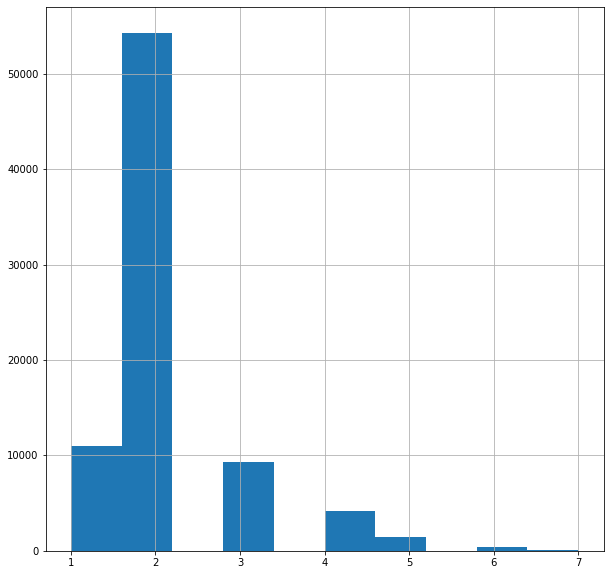

In [19]:
plt.figure(figsize=(10,10))

data['vei'].hist()


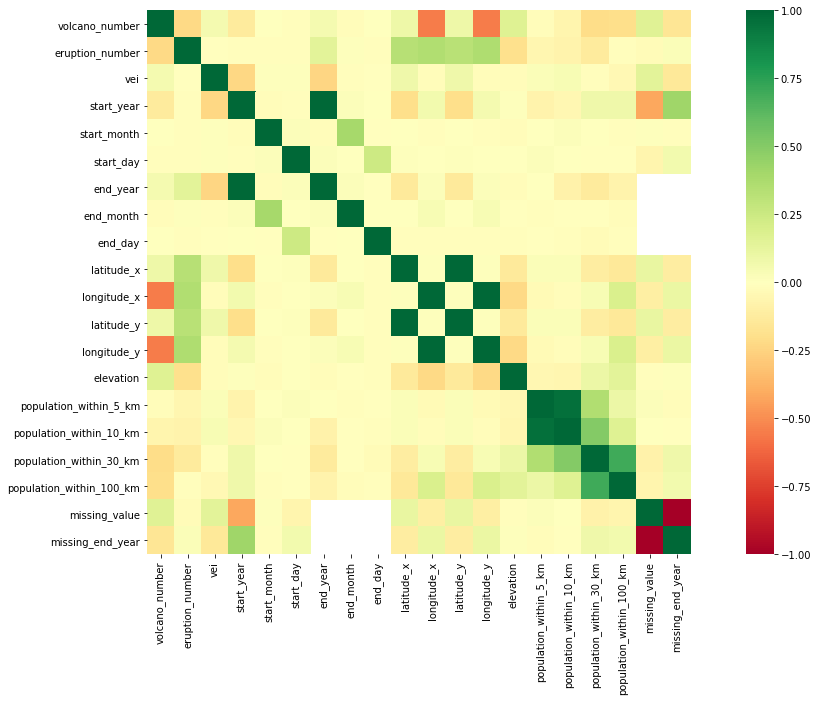

In [20]:
#Finding relationship between columns 
import seaborn as sns
plt.figure(figsize=(20,10))
sns.heatmap(data.corr(), square=True, cmap='RdYlGn')

The Volcanic Explosivity Index (VEI) is a relative measure of the explosiveness of volcanic eruptions. So my guess is that it should have big impact for the eruptions. The bigger the vei - the bigger eruption number. 


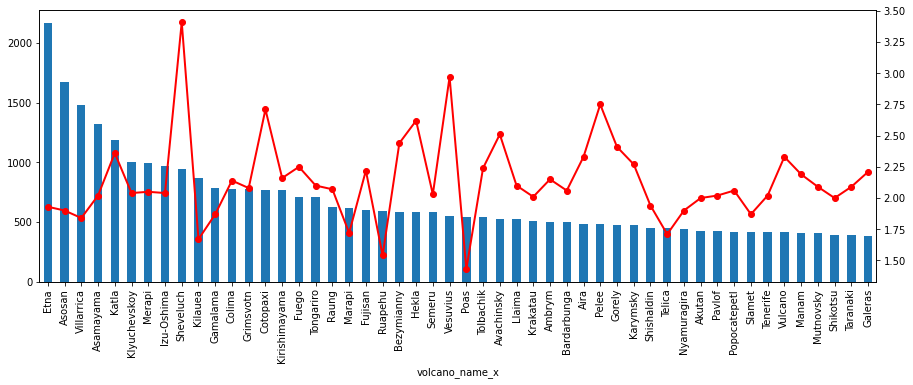

In [28]:
#Making dataset
data3 = data.groupby(['volcano_name_x']).size().to_frame()
data4 = data.groupby("volcano_name_x")['vei'].mean().round(2).to_frame()
data5 = pd.merge(data3, data4, how='left', on='volcano_name_x' )
#Getting top 20 most erupted vulcanoes
data_5= data5.nlargest(50, columns=0)
#Plotting the results
plt.figure (figsize=(15,5))
ax = data_5[0].plot(kind='bar', use_index=True, )
ax2 = ax.twinx()
ax2.plot(data_5["vei"].values, linestyle='-', marker='o', linewidth=2.0,color="red")

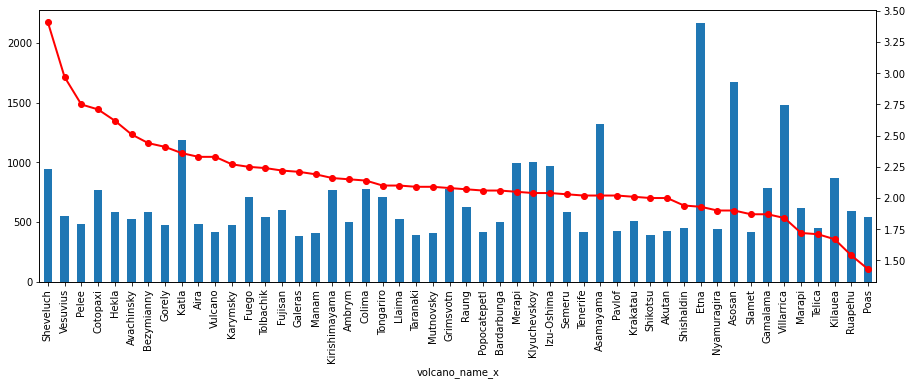

In [ ]:
#Same plot just now grouping by the biggest vei values
data6= data_5.nlargest(50, columns='vei')
plt.figure (figsize=(15,5))
ax = data6[0].plot(kind='bar', use_index=True, )
ax2 = ax.twinx()
ax2.plot(data6["vei"].values, linestyle='-', marker='o', linewidth=2.0,color="red")

In [ ]:
data_5['eruptions']=data_5[0]
data3['eruptions']=data3[0]

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


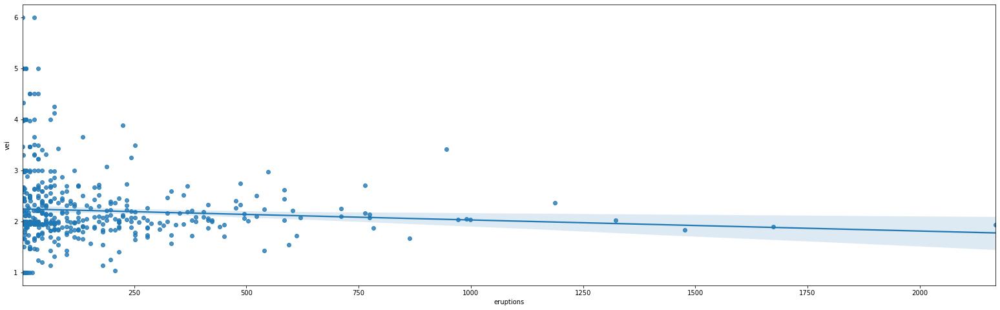

In [ ]:
#Another plot
data5['eruptions']=data5[0]
fig = plt.figure(figsize=(27,8))
sns.regplot('eruptions',"vei", data=data5)

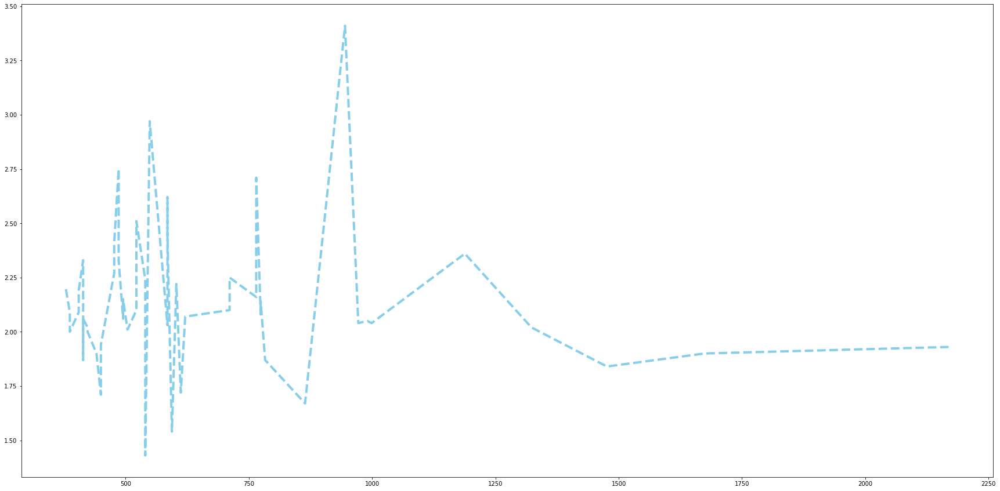

In [ ]:

plt.figure (figsize=(30,15))
plt.plot(data_5['eruptions'], data_5['vei'], '--',color='skyblue', linewidth=4)


From this we can see that there is a very small relationship between VEI and eruptions, which makes my hyptosesis false. But we can see that most vulcanos have 2 vei index.




Next I wanted to check out the relationship between popoulation and vulcanoes, how much impact does it have for the living area 

For the plots it's better to use values without nan, so that is why I changed nan to zero

In [ ]:
data

In [ ]:
data.isnull().mean().round(4)*100
data['population_within_5_km'].fillna(0)
data['population_within_10_km'].fillna(0)
data['population_within_30_km'].fillna(0)
data['population_within_100_km'].fillna(0)

In [ ]:
#Making data frame 
largest = data5.nlargest(50, columns=0)
population = data.groupby('volcano_name_x')['population_within_5_km'].sum()
population2 = data.groupby('volcano_name_x')['population_within_10_km'].sum()
f = pd.merge(largest,population, how='left', on='volcano_name_x' )
f2 = pd.merge(f,population2, how='left', on='volcano_name_x' )


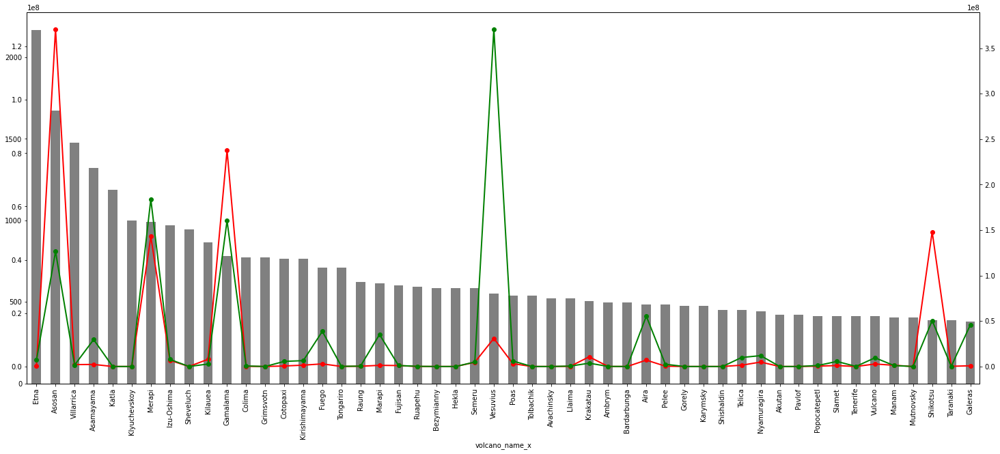

In [ ]:
#Plotting data
plt.figure (figsize=(25,10))
ax = f2[0].plot(kind='bar', use_index=True, color='grey', label='eruptions' )
ax2 = ax.twinx()
ax2.plot(f2["population_within_5_km"].values, linestyle='-', marker='o', linewidth=2.0,color="red", label='population within 5 km')
ax3= ax2.twinx()
ax3.plot(f2["population_within_10_km"].values, linestyle='-', marker='o', linewidth=2.0,color="green", label='population within 10 km')


End year most likely means that the vulcano is still active, which means that it could also have impact for the population

missing_end_year == 0, means that there is no end year, 
missing_end_year == 1, means that there is  end year

Text(0, 0.5, 'population')

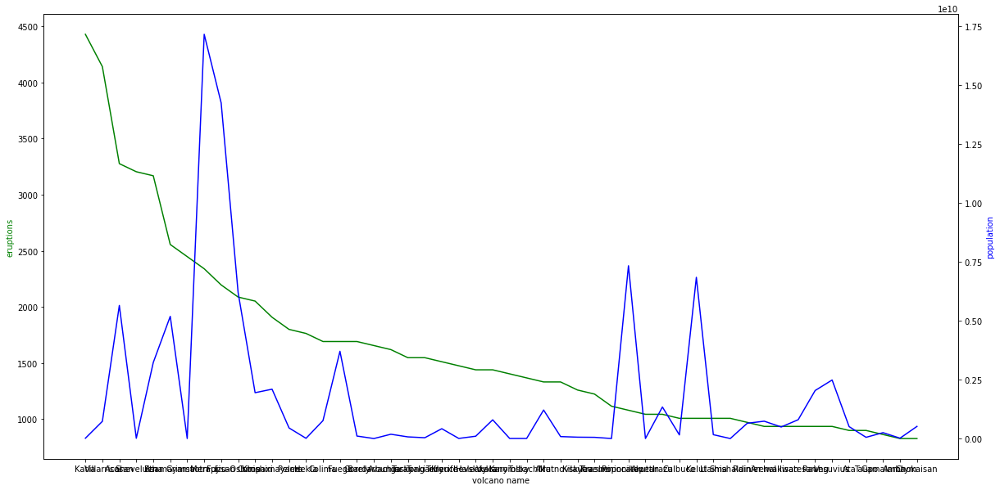

In [ ]:
data0= data.loc[data['missing_end_year']==0]
#Making dataframe

population1 = pd.melt(data0, id_vars=['volcano_name_x'], value_vars=['population_within_5_km', 'population_within_10_km','population_within_30_km', 'population_within_100_km'])
name = population1.groupby(['volcano_name_x']).size().to_frame()
population2 = population1.groupby('volcano_name_x')["value"].sum().to_frame()
population = pd.merge(name, population2, how='left', on="volcano_name_x")
population['eruptions']=population[0]
#plotting
population=population.nlargest(50, columns='eruptions')


fig, ax1 = plt.subplots(figsize=(20, 10))
ax2 = ax1.twinx()
ax1.plot(population.index, population['eruptions'], 'green')
ax2.plot(population.index, population['value'], 'blue')
ax1.set_xlabel('volcano name')
ax1.set_ylabel('eruptions', color='g')
ax2.set_ylabel('population', color='b')
#ax2.plot(population["eruptions"].values, linestyle='-', marker='o', linewidth=2.0,color="red")
#ax3= ax2.twinx()
#ax3.plot(population["value"].values, linestyle='-', marker='o', linewidth=2.0,color="green")


Making the same plot, just with missing_end_year =1

Text(0, 0.5, 'population')

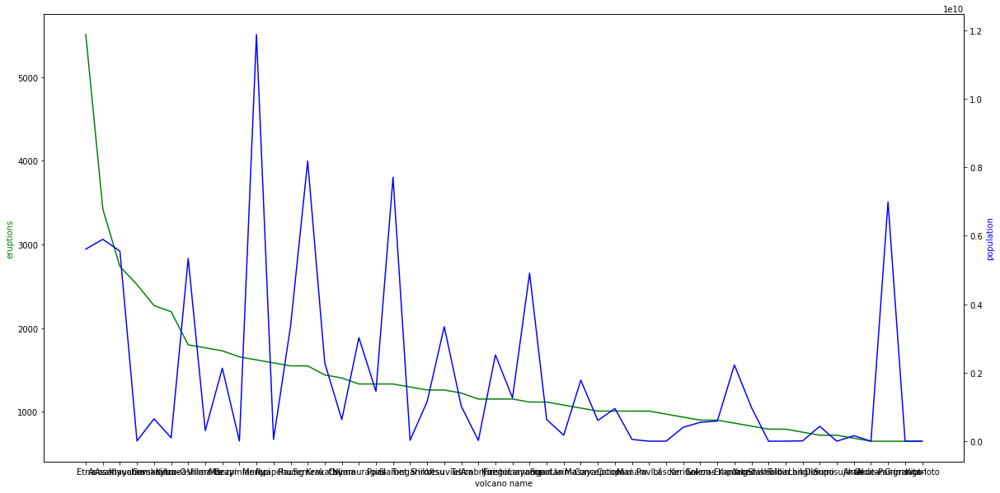

In [ ]:
data0= data.loc[data['missing_end_year']==1]
#Making dataframe

population1 = pd.melt(data0, id_vars=['volcano_name_x'], value_vars=['population_within_5_km', 'population_within_10_km','population_within_30_km', 'population_within_100_km'])
name = population1.groupby(['volcano_name_x']).size().to_frame()
population2 = population1.groupby('volcano_name_x')["value"].sum().to_frame()
population = pd.merge(name, population2, how='left', on="volcano_name_x")
population['eruptions']=population[0]
#plotting
population=population.nlargest(50, columns='eruptions')


fig, ax1 = plt.subplots(figsize=(20, 10))
ax2 = ax1.twinx()
ax1.plot(population.index, population['eruptions'], 'green')
ax2.plot(population.index, population['value'], 'blue')
ax1.set_xlabel('volcano name')
ax1.set_ylabel('eruptions', color='g')
ax2.set_ylabel('population', color='b')

Major rocks and minor rocks.
Thinking logically, those vulcanos that has erupted the most shoud have the biggest rock count number. Let's figure out if it's true

In [25]:
#Creating dummy variables to measure how much major rock was erupted
data['Major_rock'] = data['Major_rock'].replace(0, np.nan)
data['no_rock']= data['Major_rock'].isna()
mapping = { True: 0, False: 1}
data['majorrock'] = data['no_rock'].map(mapping)
data

,volcano_number,volcano_name_x,eruption_number,vei,start_year,start_month,start_day,end_year,end_month,end_day,latitude_x,longitude_x,volcano_name_y,primary_volcano_type,last_eruption_year,country,latitude_y,longitude_y,Major_rock,elevation,population_within_5_km,population_within_10_km,population_within_30_km,population_within_100_km,variable,minor_rock,_merge,missing_value,missing_end_year,no_rock2,minorrock,no_rock,majorrock
0,266030,Soputan,22354,1.947897,2020.0,3.0,23.0,2020.0,4.0,2.0,1.112,124.737,Soputan,Stratovolcano,2020,Indonesia,1.112,124.737,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,minor_rock_1,NaN,both,False,1,True,0,True,0
1,266030,Soputan,22354,1.947897,2020.0,3.0,23.0,2020.0,4.0,2.0,1.112,124.737,Soputan,Stratovolcano,2020,Indonesia,1.112,124.737,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,minor_rock_1,NaN,both,False,1,True,0,True,0
2,266030,Soputan,22354,1.947897,2020.0,3.0,23.0,2020.0,4.0,2.0,1.112,124.737,Soputan,Stratovolcano,2020,Indonesia,1.112,124.737,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,minor_rock_1,NaN,both,False,1,True,0,True,0
3,266030,Soputan,22354,1.947897,2020.0,3.0,23.0,2020.0,4.0,2.0,1.112,124.737,Soputan,Stratovolcano,2020,Indonesia,1.112,124.737,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,minor_rock_2,NaN,both,False,1,True,0,True,0
4,266030,Soputan,22354,1.947897,2020.0,3.0,23.0,2020.0,4.0,2.0,1.112,124.737,Soputan,Stratovolcano,2020,Indonesia,1.112,124.737,NaN,1785.0,4724.0,69991.0,501336.0,1696768.0,minor_rock_2,NaN,both,False,1,True,0,True,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87645,390090,Saunders,21099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-57.800,-26.483,Saunders,Stratovolcano,2020,NaN,-57.800,-26.483,NaN,843.0,NaN,NaN,NaN,NaN,minor_rock_2,NaN,both,True,0,True,0,True,0
87646,390090,Saunders,21099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-57.800,-26.483,Saunders,Stratovolcano,2020,NaN,-57.800,-26.483,NaN,843.0,NaN,NaN,NaN,NaN,minor_rock_2,NaN,both,True,0,True,0,True,0
87647,390090,Saunders,21099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-57.800,-26.483,Saunders,Stratovolcano,2020,NaN,-57.800,-26.483,NaN,843.0,NaN,NaN,NaN,NaN,minor_rock_3,NaN,both,True,0,True,0,True,0
87648,390090,Saunders,21099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-57.800,-26.483,Saunders,Stratovolcano,2020,NaN,-57.800,-26.483,NaN,843.0,NaN,NaN,NaN,NaN,minor_rock_3,NaN,both,True,0,True,0,True,0


In [26]:
data['minor_rock'] = data['minor_rock'].replace(0, np.nan)
data['no_rock2']= data['minor_rock'].isna()
mapping = { True: 0, False: 1}
data['minorrock'] = data['no_rock2'].map(mapping)

In [29]:
#Making dataframe 
major = data.groupby('volcano_name_x')['majorrock'].sum().to_frame()
minorrock = data.groupby('volcano_name_x')['minorrock'].sum().to_frame()
major2 = pd.merge(data_5, major, how='left', on=['volcano_name_x'])
rock = pd.merge(major2, minorrock, how='left', on=['volcano_name_x'] )
rock['total_rocks'] = rock['minorrock']+rock['majorrock']
rock['eruptions']=rock[0]

In [ ]:
rock2= rock.nlargest(30, columns=['total_rocks'])
rock2

,0,vei,eruptions,majorrock,minorrock,total_rocks
volcano_name_x,,,,,,
Asosan,1674,1.90,1674,1116,0,1116
Katla,1188,2.36,1188,792,0,792
Cotopaxi,765,2.71,765,510,0,510
Villarrica,1476,1.84,1476,492,0,492
Asamayama,1323,2.02,1323,441,0,441
Izu-Oshima,972,2.04,972,0,324,324
Aira,486,2.33,486,324,0,324
Shishaldin,450,1.94,450,0,300,300
Gamalama,783,1.87,783,0,261,261


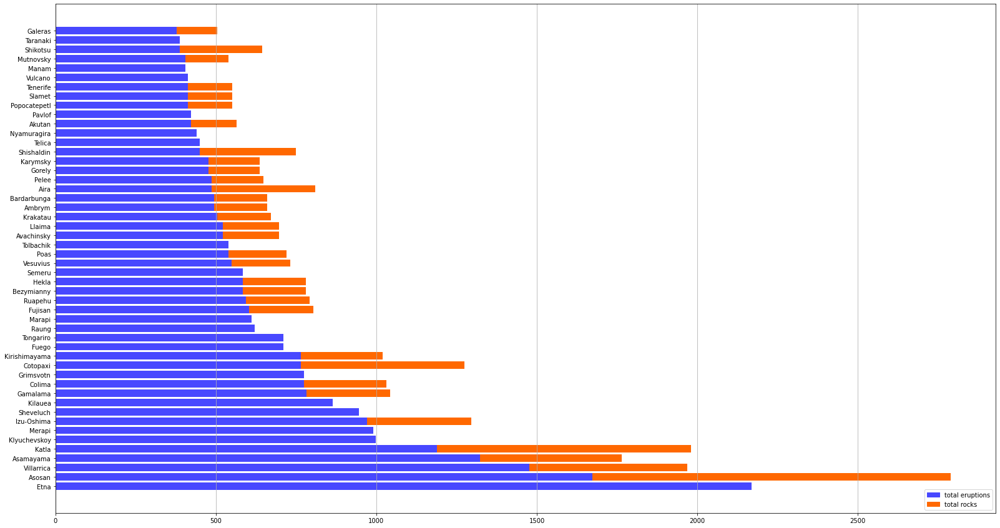

In [30]:
import matplotlib.patches as mpatches
fig = plt.figure(figsize=(27,15))
#data
purple = rock["eruptions"]
orange = rock["total_rocks"]
y = np.arange (len(purple))
#plot
plt.barh (y, purple,color='#4848FF' )
plt.barh (y, orange, color = '#FF6800', left = purple ) #left function describes where the orange part should begin

#labels 

y_labels = rock.index
plt.yticks (y, y_labels)

purple_patch= mpatches.Patch(color='#4848FF', label ="total eruptions")
orange_patch= mpatches.Patch(color='#FF6800', label ="total rocks")
plt.legend (handles=[purple_patch, orange_patch], loc = "lower right")

plt.grid(axis='x') 
plt.show()

These results, again, makes my hypothesis false, because rock count don't have direct relationship with the count of eruptions. Number of rocks depends more of the type of the vulcano.

In [ ]:
fg = data.groupby(data.index)['volcano_number'].sum()
fg = fg.to_frame()
#Cia va jei paruninsi pamatysi visus metus kokie yra 
#pd.set_option("display.max_rows", None, "display.max_columns", None)

print(fg)